# Inspecting Data

This notebook inspects the autocorelations by generating waterfall plots and averaging the data across the whole night.

In [21]:
%matplotlib inline
from collections import OrderedDict
import matplotlib as mpl
import numpy as np
import pylab
import pyuvdata
import hera_cal as hc
import aipy.miriad as apm
import os
import glob
import copy
from astropy.time import Time

## Setting the data path and loading the files

In [2]:
data_path = '/lustre/aoc/projects/hera/rnunhoke/H3C/2458763'

In [3]:
uvh5_files = sorted(glob.glob("{0}/zen.*.*.HH.uvh5".format(data_path)))
uvh5_dfiles = sorted(glob.glob("{0}/zen.*.*.HH.diff.uvh5".format(data_path)))

Nfiles = len(uvh5_files)
print ('Number of files: {}'.format(Nfiles))

Number of files: 90


In [4]:
# laoding data
#first file
uvd1 = pyuvdata.UVData()
uvd1.read_uvh5(uvh5_files[0:1], polarizations=[-5, -6])


# last file
uvd2 = pyuvdata.UVData()
uvd2.read_uvh5(uvh5_files[-1], polarizations=[-5, -6])

# difference file
duvd1 = pyuvdata.UVData()
duvd1.read_uvh5(uvh5_dfiles[0:1], polarizations=[-5, -6])

## Observation Details

In [5]:
# extracting meta data
ants = uvd1.get_ants()
freqs = uvd1.freq_array[0]
times = uvd1.time_array
lsts = uvd1.lst_array
pols = uvd1.polarization_array

jd_start = np.floor(times.min())
jd_start = np.floor(times.min())

Nfreqs = len(freqs)
Ntimes = len(times)
Npols = len(pols)
Nants = len(ants)

lst0 = np.min(uvd1.lst_array) * 12 / np.pi
lst1 = np.max(uvd2.lst_array) * 12 / np.pi

utc0 = Time(np.max(uvd1.time_array), format='jd').datetime
utc1 = Time(np.max(uvd2.time_array), format='jd').datetime

print ('Nfreqs: {}\nNtimes: {}\nNpols: {}\nNants: {}'.format(Nfreqs, Ntimes, Npols, Nants))
print ('Observation Start: {}'.format(utc0))
print ('Observation Stop: {}'.format(utc1))
print ('LST: {:.2f} to  {:.2f} hours'.format(lst0, lst1))

Nfreqs: 1536
Ntimes: 22701
Npols: 2
Nants: 46
Observation Start: 2019-10-06 22:10:05.588414
Observation Stop: 2019-10-07 03:11:06.999641
LST: 0.56 to  5.65 hours


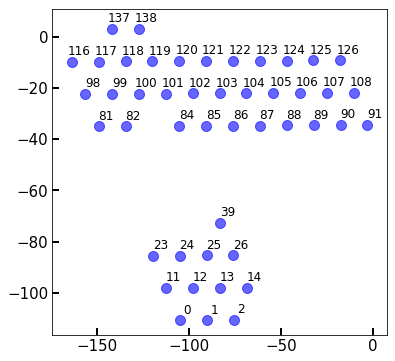

In [29]:
def plot_ant(uvd, ex_ants=[]):
    lat,lon,alt  = uvd.telescope_location_lat_lon_alt
    for i, (ant, k) in enumerate(zip(uvd.antenna_numbers, uvd.antenna_positions)):
        ecef = k + uvd.telescope_location
        pos = pyuvdata.utils.ENU_from_ECEF(ecef, *uvd.telescope_location_lat_lon_alt).T
        if ant in ex_ants:
            pylab.scatter(pos[0], pos[1], marker='o', s=100, c='red', alpha=0.6)
        else:
            pylab.scatter(pos[0], pos[1], marker='o', s=100, c='blue', alpha=0.6)
        pylab.text(pos[0]+4, pos[1]+4, '{0}'.format(ant), size=12, 
                   horizontalalignment='center', verticalalignment='center')

    pylab.tick_params(direction='in', width=2, length=7, labelsize=15)

fig = pylab.figure(figsize=(6,6))
plot_ant(uvd1)

In [7]:
def timeseries_data(files, antennas, uv_old):
    _oldd = {}
    _d = {}
    for ant in antennas:
        auto_bl = (ant, ant)
        _oldd[auto_bl] = uv_old.get_data(auto_bl)   
    
    for i, fl in enumerate(files):
        uvd_new = pyuvdata.UVData()
        uvd_new.read_uvh5(fl, polarizations=[-5, -6])
        for ant in antennas: 
            auto_bl = (ant, ant)
            if i==0:
                d_old = _oldd[auto_bl]
            else:
                d_old = _d[auto_bl] 
            d_new = uvd_new.get_data(auto_bl)
            _d[auto_bl] = np.concatenate((d_old, d_new), axis=0) 
            
    return _d


In [8]:
uvd_old = copy.deepcopy(uvd1)
data = timeseries_data(uvh5_files, ants, uvd_old)

uvd_dold = copy.deepcopy(duvd1)
diff_data = timeseries_data(uvh5_dfiles, ants, uvd_dold)

## Autocorrelations across the whole night  (East West)

Text(0.5,0.98,'EW polarization: waterfall plots')

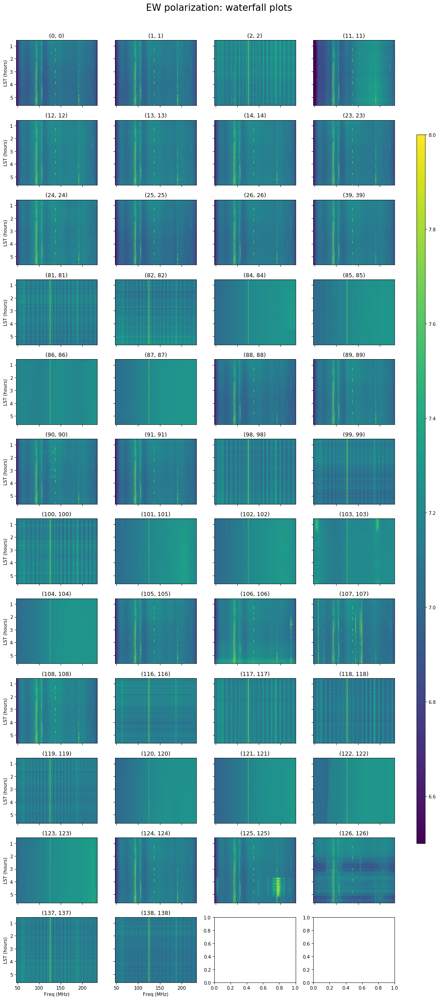

In [22]:
Nside = 4
Yside = int(np.ceil(len(ants))/Nside) + 1
fig, axes = pylab.subplots(Yside, Nside, figsize=(13, 10*float(Yside)/Nside), dpi=75)
fig.tight_layout(rect=(0, 0, 1, 0.95))  
k = 0
for i in range(Yside):
    for j in range(Nside):
        if k < len(ants):
            ax = axes[i,j]
            auto_bl = (ants[k], ants[k])
            ax.set_title(auto_bl)
            im = ax.imshow(np.log10(np.abs(data[auto_bl][:, : , 0])), 
                           aspect='auto', vmin=6.5, vmax=8, e
                           xtent=[freqs[0] * 1e-6, freqs[-1] * 1e-6, lst1, lst0])

        #else:
        #    ax.axis('off')
            
        if j != 0:
            ax.set_yticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_yticklabels()]
            ax.set_ylabel('LST (hours)', fontsize=10)
        if i != Yside-1:
            ax.set_xticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_xticklabels()]
            ax.set_xlabel('Freq (MHz)', fontsize=10)
            
        k += 1
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax)
fig.suptitle('EW polarization: waterfall plots', fontsize=20)

## Autocorrelations across the whole night  (North South)

Text(0.5,0.98,'NS polarization: waterfall plots')

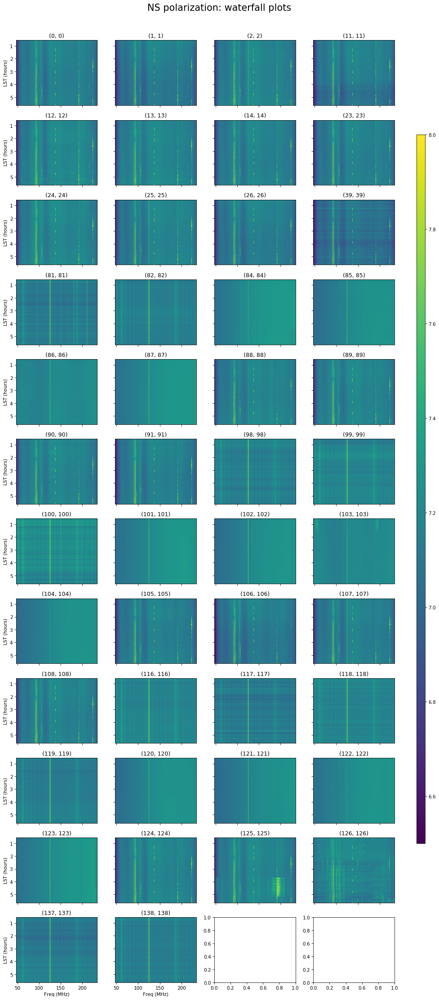

In [23]:
Nside = 4
Yside = int(np.ceil(len(ants))/Nside) + 1
fig, axes = pylab.subplots(Yside, Nside, figsize=(13, 10*float(Yside)/Nside), dpi=75)
fig.tight_layout(rect=(0, 0, 1, 0.95))  
k = 0
for i in range(Yside):
    for j in range(Nside):
        if k < len(ants):
            ax = axes[i,j]
            auto_bl = (ants[k], ants[k])
            ax.set_title(auto_bl)
            im = ax.imshow(np.log10(np.abs(data[auto_bl][:, : , 1])), aspect='auto', vmin=6.5, vmax=8, extent=[freqs[0] * 1e-6, freqs[-1] * 1e-6, lst1, lst0])

        #else:
        #    ax.axis('off')
            
        if j != 0:
            ax.set_yticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_yticklabels()]
            ax.set_ylabel('LST (hours)', fontsize=10)
        if i != Yside-1:
            ax.set_xticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_xticklabels()]
            ax.set_xlabel('Freq (MHz)', fontsize=10)
            
        k += 1
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax)
fig.suptitle('NS polarization: waterfall plots', fontsize=20)

## Spectra across specific frequency

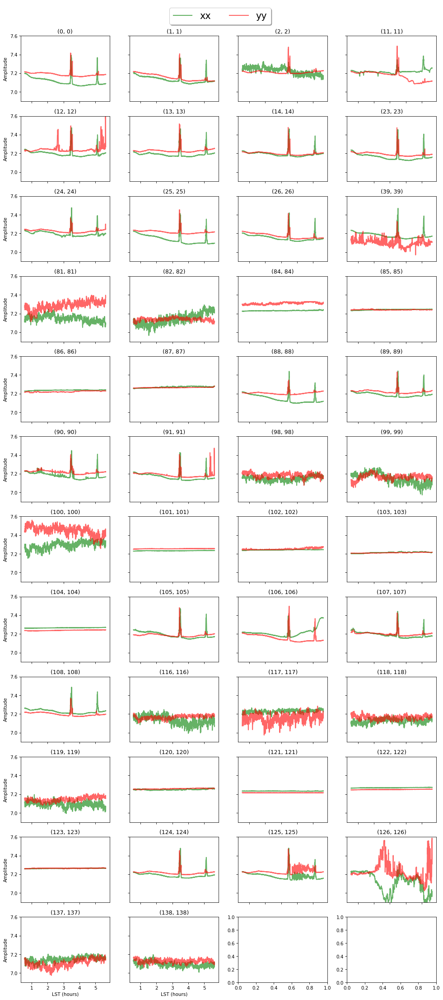

In [24]:
lst_range = np.linspace(lst0, lst1, len(data[(0, 0)]))

# desired frequency
f0 = 150e6
df = freqs[1] - freqs[0]
ch  = int((f0 - freqs[0])/df)

Nside = 4
Yside = int(np.ceil(len(ants))/Nside) + 1
fig, axes = pylab.subplots(Yside, Nside, figsize=(13, 10*float(Yside)/Nside), dpi=75)
fig.tight_layout(rect=(0, 0, 1, 0.95))  
k = 0
for i in range(Yside):
    for j in range(Nside):
        if k < len(ants):
            ax = axes[i,j]
            auto_bl = (ants[k], ants[k])
            ax.set_title(auto_bl)
            ax.plot(lst_range, np.log10(np.abs(data[(ants[k], ants[k])][:, ch, 0])), 
                    linewidth=2, label='EW', alpha=0.6, color='green')
            ax.plot(lst_range, np.log10(np.abs(data[(ants[k], ants[k])][:, ch, 1])), 
                    linewidth=2, label='NS', alpha=0.6, color='red')
            ax.set_ylim(6.9, 7.6)
        
        if j != 0:
            ax.set_yticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_yticklabels()]
            ax.set_ylabel('Amplitude', fontsize=10)
        if i != Yside-1:
            ax.set_xticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_xticklabels()]
            ax.set_xlabel('LST (hours)', fontsize=10)
        k += 1

fig.legend(labels = ['xx', 'yy'], loc='upper center', bbox_to_anchor=(0.5,0.98), ncol=2, fancybox=True, shadow=True, fontsize=20)

## Averaged spectra over entire night 

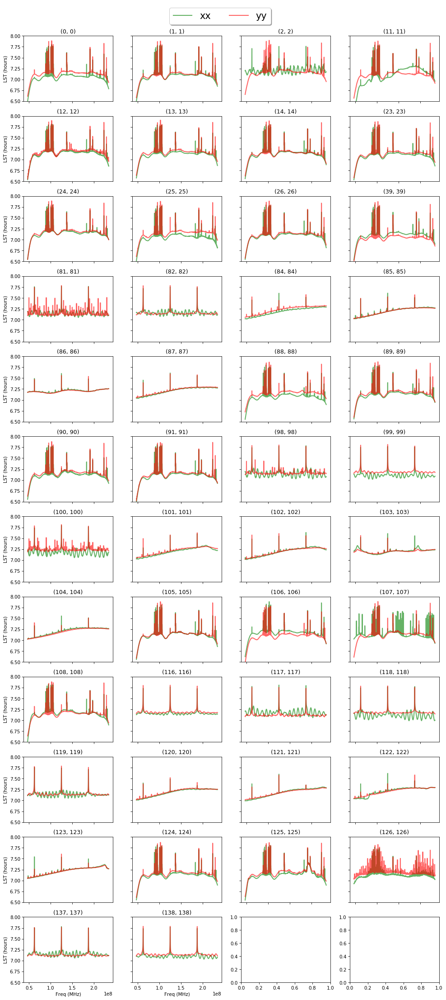

In [25]:
Nside = 4
Yside = int(np.ceil(len(ants))/Nside) + 1
fig, axes = pylab.subplots(Yside, Nside, figsize=(13, 10*float(Yside)/Nside), dpi=75)
fig.tight_layout(rect=(0, 0, 1, 0.95))  
k = 0
for i in range(Yside):
    for j in range(Nside):
        if k < len(ants):
            ax = axes[i,j]
            auto_bl = (ants[k], ants[k])
            ax.set_title(auto_bl)
            ax.plot(freqs, np.log10(np.abs(np.mean(data[(ants[k], ants[k])], axis=0)))[:,0], 
                    linewidth=2, label='EW', alpha=0.6, color='green')
            ax.plot(freqs, np.log10(np.abs(np.mean(data[(ants[k], ants[k])], axis=0)))[:,1], 
                    linewidth=2, label='NS', alpha=0.6, color='red')
            ax.set_ylim(6.5, 8)
        
        if j != 0:
            ax.set_yticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_yticklabels()]
            ax.set_ylabel('LST (hours)', fontsize=10)
        if i != Yside-1:
            ax.set_xticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_xticklabels()]
            ax.set_xlabel('Freq (MHz)', fontsize=10)
        k += 1

fig.legend(labels = ['xx', 'yy'], loc='upper center', 
           bbox_to_anchor=(0.5,0.98), ncol=2, fancybox=True, 
           shadow=True, fontsize=20)

## Crude way to find some of the bad antennas 

Number of bad antenna for EW polarization: 23
Number of bad antenna for EW polarization: 21


Text(0.5,1,'NS polarization')

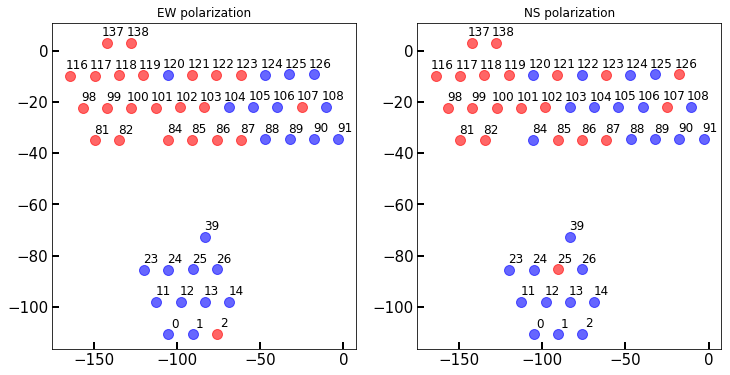

In [26]:
def find_badants(pol, start=600, stop=900, factor = 1):
    stds = np.array([])
    for i in ants:
        std = np.std(np.diff(np.mean(uvd1.get_data(i, i, pol), axis=0))[start:stop])
        stds = np.append(stds, std)    

    std_mean = np.mean(stds)
    bad_ants = ants[np.where(stds> factor * std_mean)]
    
    return bad_ants

bad_antsxx = find_badants('xx', start=600, stop=900, factor = 0.8)
bad_antsyy = find_badants('yy', start=600, stop=900, factor = 1)

print ('Number of bad antenna for EW polarization: {}'.format(len(bad_antsxx)))
print ('Number of bad antenna for EW polarization: {}'.format(len(bad_antsyy)))  

fig = pylab.figure(figsize=(12,6))
pylab.subplot(121)
plot_ant(uvd1, ex_ants=bad_antsxx)
pylab.title('EW polarization')

pylab.subplot(122)
plot_ant(uvd1, ex_ants=bad_antsyy)
pylab.title('NS polarization')

## Plotting the difference files

### East West polarization

divide by zero encountered in log10


Text(0.5,0.98,'EW polarization: difference waterfall plots')

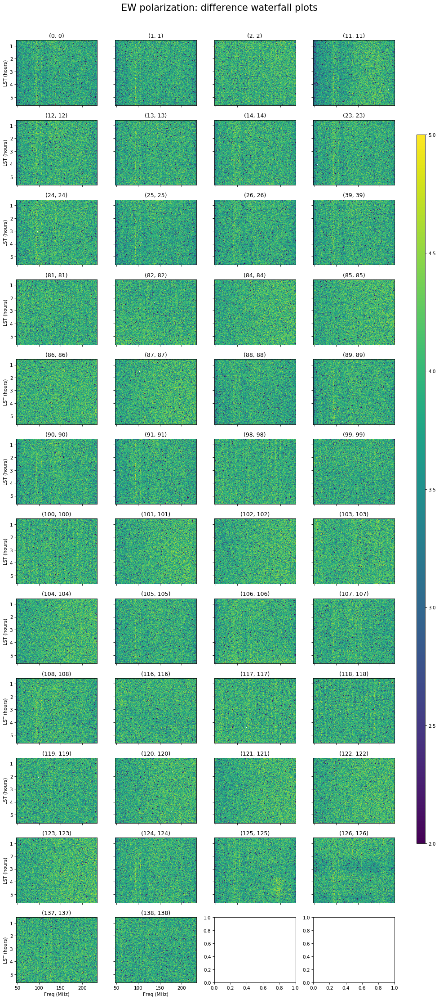

In [27]:
Nside = 4
Yside = int(np.ceil(len(ants))/Nside) + 1
fig, axes = pylab.subplots(Yside, Nside, figsize=(13, 10*float(Yside)/Nside), dpi=75)
fig.tight_layout(rect=(0, 0, 1, 0.95))  
k = 0
for i in range(Yside):
    for j in range(Nside):
        if k < len(ants):
            ax = axes[i,j]
            auto_bl = (ants[k], ants[k])
            ax.set_title(auto_bl)
            im = ax.imshow(np.log10(np.abs(diff_data[auto_bl][:, : , 0])), 
                           aspect='auto', vmin=2, vmax=5, 
                           extent=[freqs[0] * 1e-6, freqs[-1] * 1e-6, lst1, lst0])

        #else:
        #    ax.axis('off')
            
        if j != 0:
            ax.set_yticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_yticklabels()]
            ax.set_ylabel('LST (hours)', fontsize=10)
        if i != Yside-1:
            ax.set_xticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_xticklabels()]
            ax.set_xlabel('Freq (MHz)', fontsize=10)
            
        k += 1
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax)
fig.suptitle('EW polarization: difference waterfall plots', fontsize=20)

# North South polarization

divide by zero encountered in log10


Text(0.5,0.98,'EW polarization: difference waterfall plots')

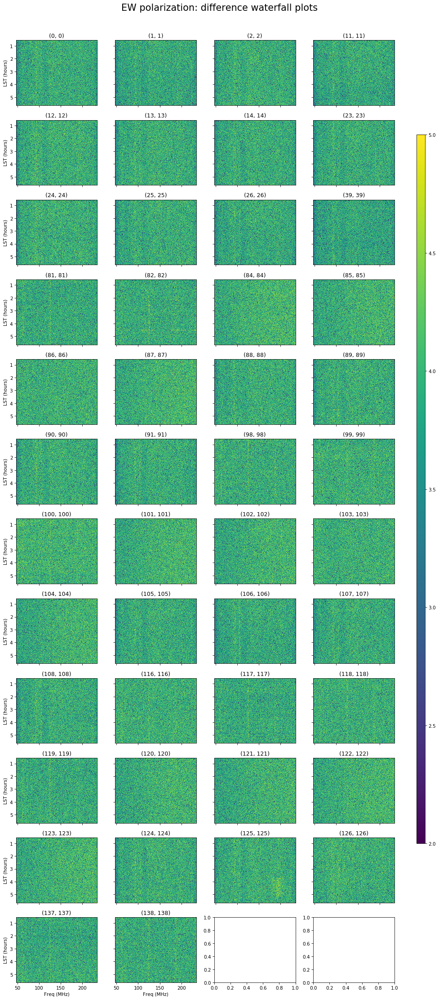

In [28]:
Nside = 4
Yside = int(np.ceil(len(ants))/Nside) + 1
fig, axes = pylab.subplots(Yside, Nside, figsize=(13, 10*float(Yside)/Nside), dpi=75)
fig.tight_layout(rect=(0, 0, 1, 0.95))  
k = 0
for i in range(Yside):
    for j in range(Nside):
        if k < len(ants):
            ax = axes[i,j]
            auto_bl = (ants[k], ants[k])
            ax.set_title(auto_bl)
            im = ax.imshow(np.log10(np.abs(diff_data[auto_bl][:, : , 1])), 
                           aspect='auto', vmin=2, vmax=5, 
                           extent=[freqs[0] * 1e-6, freqs[-1] * 1e-6, lst1, lst0])

        #else:
        #    ax.axis('off')
            
        if j != 0:
            ax.set_yticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_yticklabels()]
            ax.set_ylabel('LST (hours)', fontsize=10)
        if i != Yside-1:
            ax.set_xticklabels([])
        else:
            [t.set_fontsize(10) for t in ax.get_xticklabels()]
            ax.set_xlabel('Freq (MHz)', fontsize=10)
            
        k += 1
fig.subplots_adjust(right=0.9)
cbar_ax = fig.add_axes([0.95, 0.15, 0.02, 0.7])
fig.colorbar(im, cax=cbar_ax)
fig.suptitle('EW polarization: difference waterfall plots', fontsize=20)